In [1]:
%matplotlib inline
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import scipy as sp
import json
#import open3d as o3d

In [2]:
def plot_imgsN(*args):
  N = len(args)
  rows = np.ceil(np.sqrt(N/2)).astype(int)
  cols = 2 * rows
  fig, axs = plt.subplots(rows, cols, figsize=(16, 8))
  fig.tight_layout()
  for i,ax in enumerate(axs.flatten()):
    if i >= N:
      ax.set_axis_off()
      continue
    ax.imshow(cv2.cvtColor(args[i],cv2.COLOR_BGR2RGB))
    ax.set_axis_off()

In [3]:
def plot_imgs2(img1, img2):
  fig, ax = plt.subplots(1, 2, figsize=(15, 20))
  for a in ax:
    a.set_axis_off()
  print(type(ax))
  ax[0].imshow(cv2.cvtColor(img1,cv2.COLOR_BGR2RGB))
  ax[1].imshow(cv2.cvtColor(img2,cv2.COLOR_BGR2RGB))

In [11]:
def plot_imgs3(img1, img2, img3):
  fig, ax = plt.subplots(1, 3, figsize=(15, 20))
  for a in ax:
    a.set_axis_off()
  ax[0].imshow(cv2.cvtColor(img1,cv2.COLOR_BGR2RGB))
  ax[1].imshow(cv2.cvtColor(img2,cv2.COLOR_BGR2RGB))
  ax[2].imshow(cv2.cvtColor(img3,cv2.COLOR_BGR2RGB))

#Image decimation and Moire pattern

In [74]:
im = cv2.cvtColor(cv2.imread("house.jpg"), cv2.COLOR_BGR2GRAY)

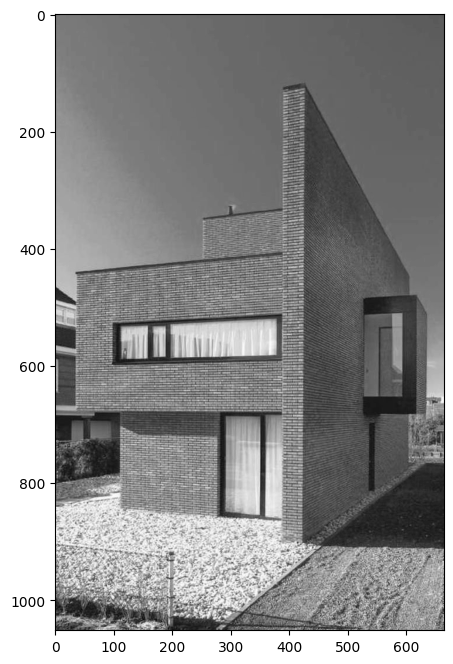

In [75]:
plt.figure(figsize=(16, 8))
plt.imshow(im, cmap = "gray")

In [76]:
# image decimation
im_4d = im[::4, ::4]

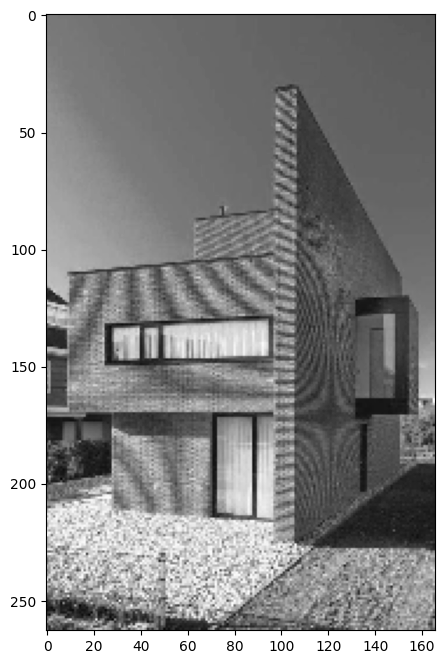

In [77]:
plt.figure(figsize=(16,8))
plt.imshow(im_4d, cmap = "gray")

## Two-dimensional DFT

In [4]:
def get_spectrum(img, decimation = 1):
  """
  Image 2D Amplitude Spectrum  Visualization
  args:
    img - input image np.array
    decimation - multiplier to correct for DFT amplitude decrease after image decimation (to compare with original spectrum)
  """
  dft = np.fft.fftshift(np.fft.fft2(img))
  # Amplitude and Phase
  A_im = np.absolute(dft*decimation)
  Phi_im = np.angle(dft)
  # scale to [0, 255]
  logA_im = (255/np.log(1 + np.max(A_im)) * np.log(1+A_im)).astype(np.uint8) # log-scaled amplitude
  Phi_im = ((Phi_im - Phi_im.min()) / (Phi_im.max() - Phi_im.min()) * 255).astype(np.uint8)
  # histogram equalization to enhace finer details
  #res = cv2.equalizeHist(A_im_norm)
  return logA_im, Phi_im

Original image spectrum

In [110]:
im_fourier, _ = get_spectrum(im)

In [111]:
_, res1 = cv2.threshold(im_fourier, 137, 255, cv2.THRESH_BINARY)

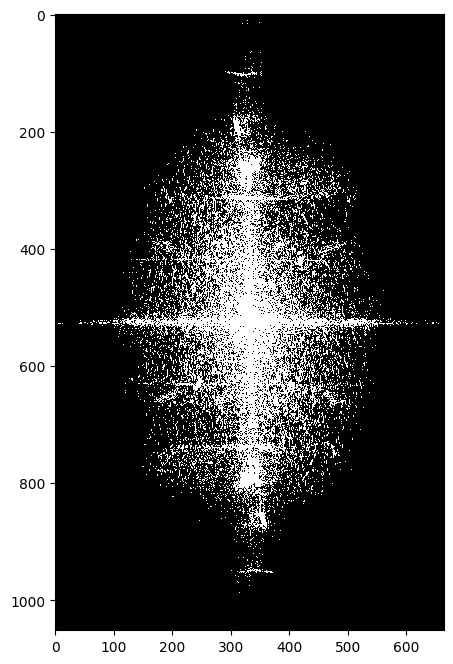

In [112]:
plt.figure(figsize=(16,8))
plt.imshow(res1, cmap = 'gray', interpolation = 'none')

Decimated image spectrum

In [97]:
im_4d_fourier, _ = get_spectrum(im_4d, decimation=4)

In [102]:
_, res2 = cv2.threshold(im_4d_fourier, 147, 255, cv2.THRESH_BINARY)

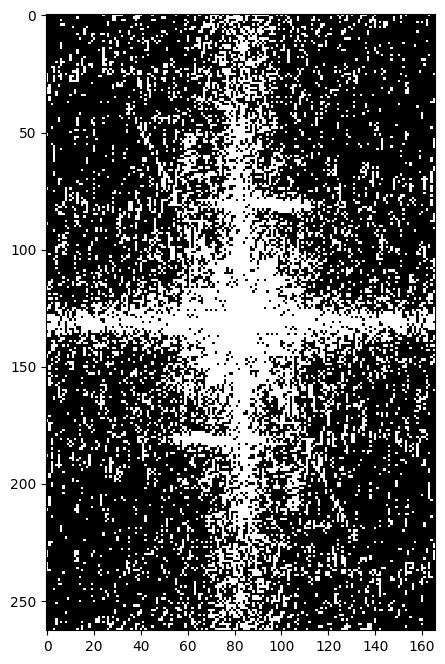

In [103]:
plt.figure(figsize=(16,8))
plt.imshow(res2, cmap = 'gray', interpolation = 'none')

## Delete frequencies greater than W_Nyquist/decimation = 1/2*decimation

In [104]:
def cutfreq(u, decimation = 2):
    """
    Cuts frequencies greater than W_nyquist/decimation
    """
    ny, nx = u.shape
    U = np.fft.fft2(u)
    U[ny//(2*decimation)+1 : (ny-1)-ny//(2*decimation), :] = 0
    U[:, nx//(2*decimation)+1 : (nx-1)-nx//(2*decimation)] = 0
    # U[ny//4+1:3*ny//4, :] = 0
    # U[:, nx//4+1:3*nx//4] = 0
    u2 = np.fft.ifft2(U)
    u2 = np.real(u2)
    u2 = np.clip(u2, 0, 255).astype(np.uint8)
    return u2


In [105]:
im_filtered = cutfreq(im, decimation=4)

<class 'numpy.ndarray'>


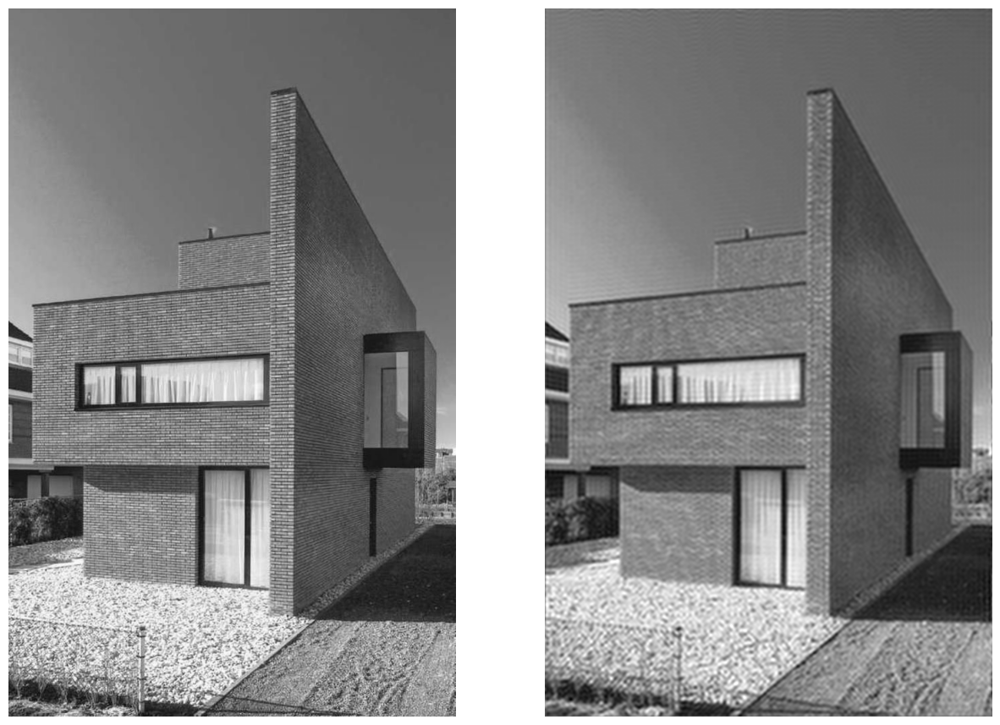

In [106]:
plot_imgs2(im, im_filtered)

In [107]:
im_filt_fourier, _ = get_spectrum(im_filtered)

In [114]:
_, res3 = cv2.threshold(im_filt_fourier, 137, 255, cv2.THRESH_BINARY)

Before and after perfect lowpass filter

<class 'numpy.ndarray'>


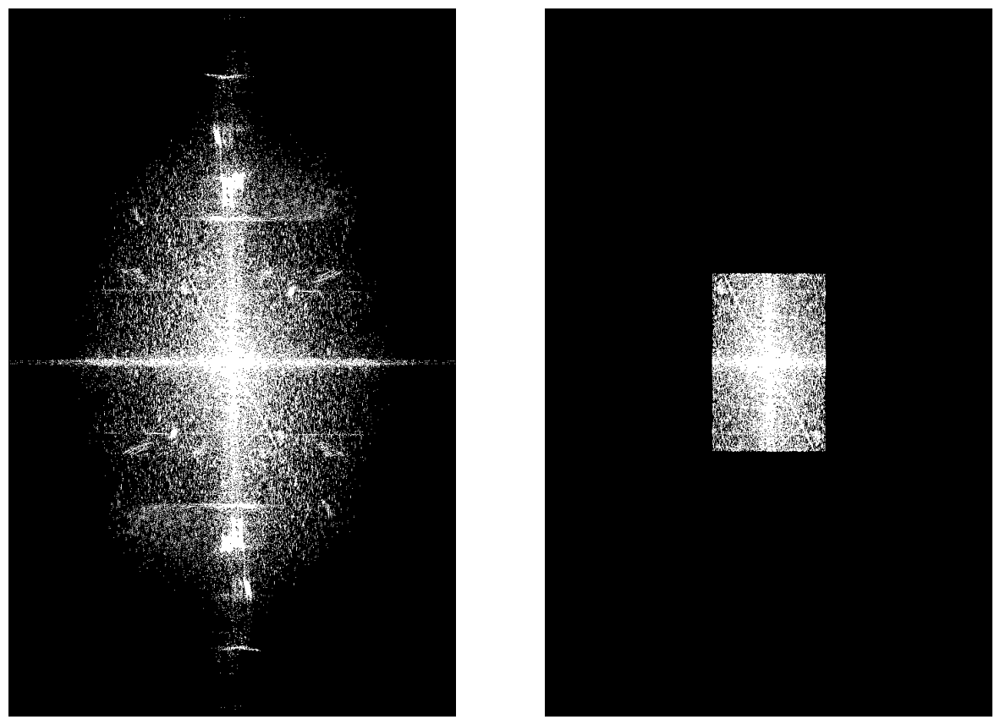

In [115]:
plot_imgs2(res1, res3)

In [116]:
im_filt_4d = im_filtered[::4, ::4]

In [117]:
im_filt_4d_fourier, _ = get_spectrum(im_filt_4d, decimation=4)

In [124]:

_, res4 = cv2.threshold(im_filt_4d_fourier, 147, 255, cv2.THRESH_BINARY)

Decimated image spectrum before and after lowpass filter

<class 'numpy.ndarray'>


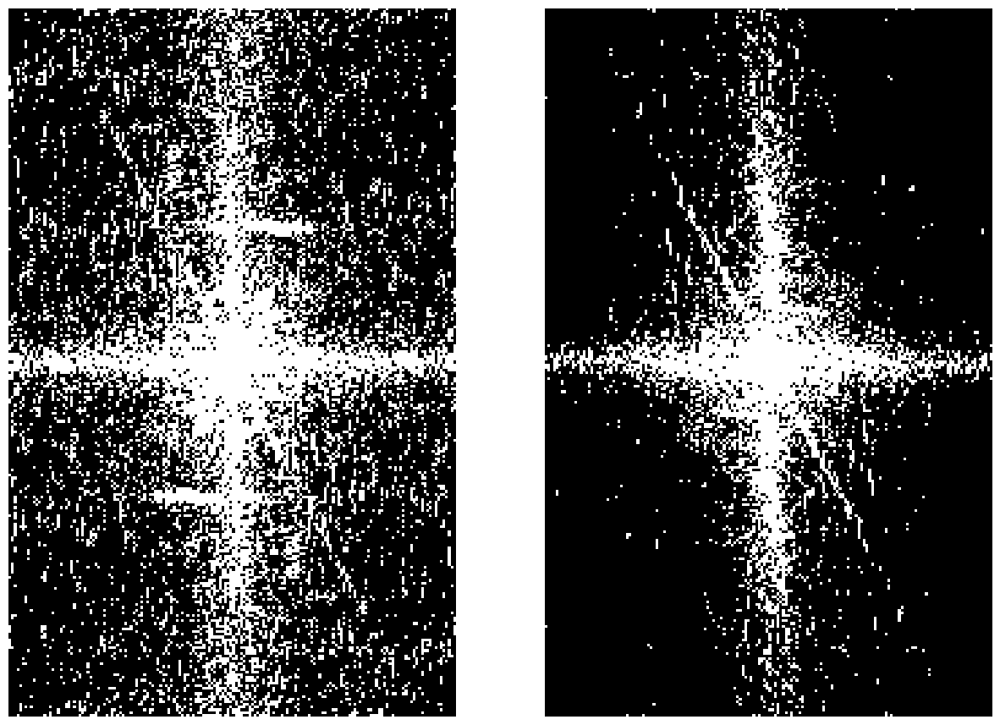

In [125]:
plot_imgs2(res2, res4)

<class 'numpy.ndarray'>


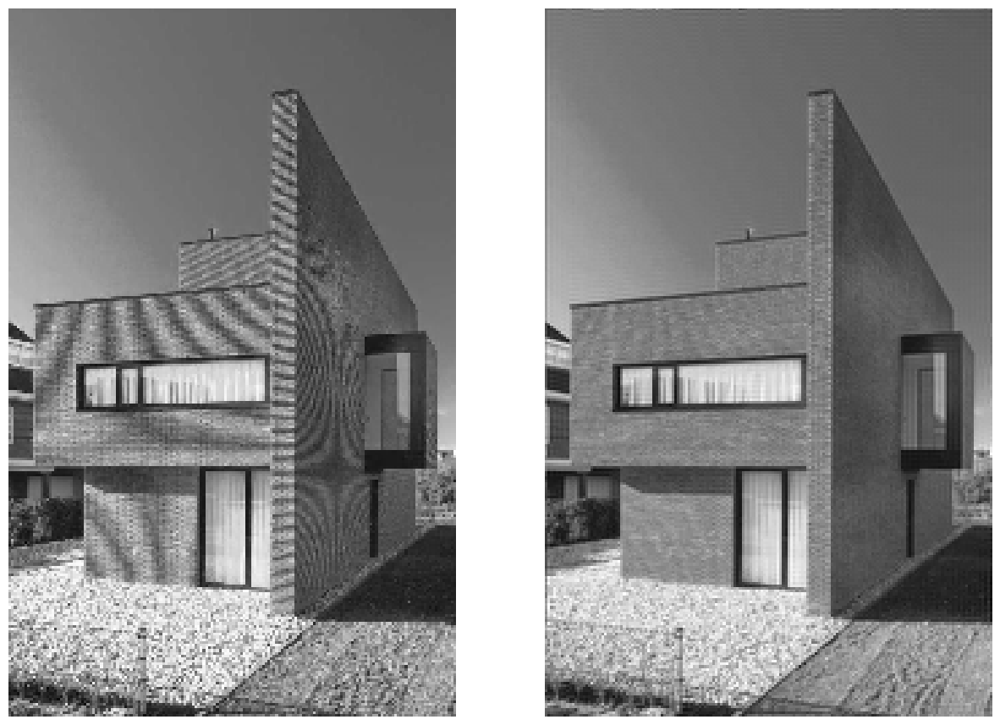

In [ ]:
plot_imgs2(im_4d, im_filt_4d)

## Gaussian filter as Low-Pass filter

In [126]:
# windowsize = 6*sigma, sigma = 1.3 (choice of sigma depends on desired cutoff frequency)
decimation = 4
sigma = decimation/np.pi
winsize = np.ceil(6*sigma).astype(int)
if winsize % 2 == 0:
  winsize +=1
im_blurred = cv2.GaussianBlur(im,(winsize, winsize), sigma, sigma)

<class 'numpy.ndarray'>


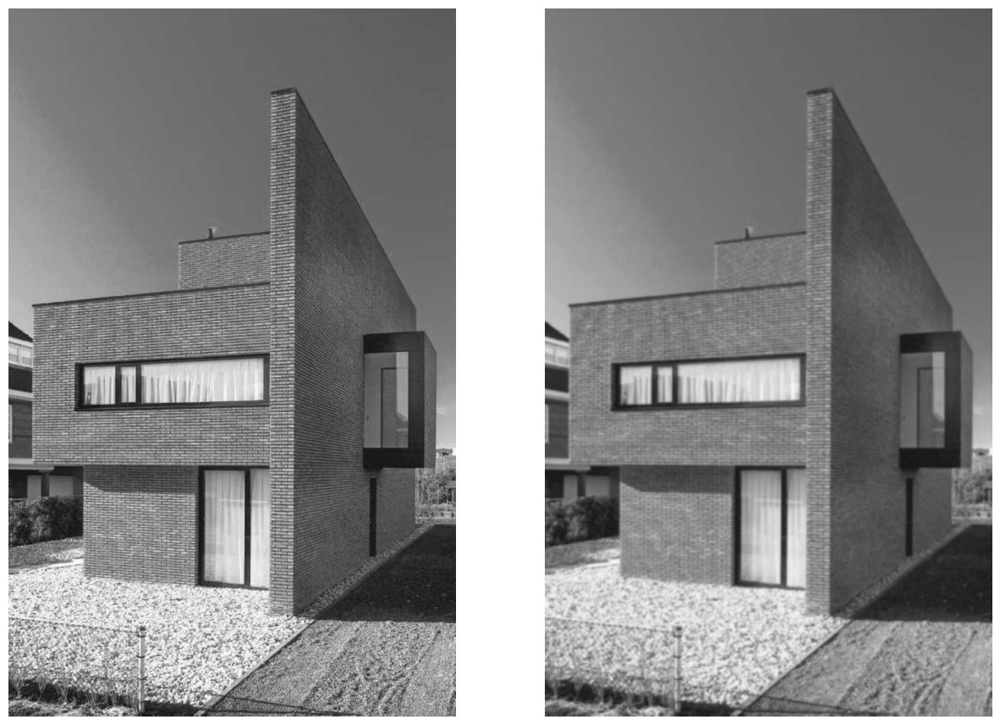

In [127]:
plot_imgs2(im, im_blurred)

In [131]:
im_blurr_fourier, _ = get_spectrum(im_blurred)

In [138]:
_, res5 = cv2.threshold(im_blurr_fourier, 127, 255, cv2.THRESH_BINARY)

Perfect lowpass filter vs Gaussian filtration

<class 'numpy.ndarray'>


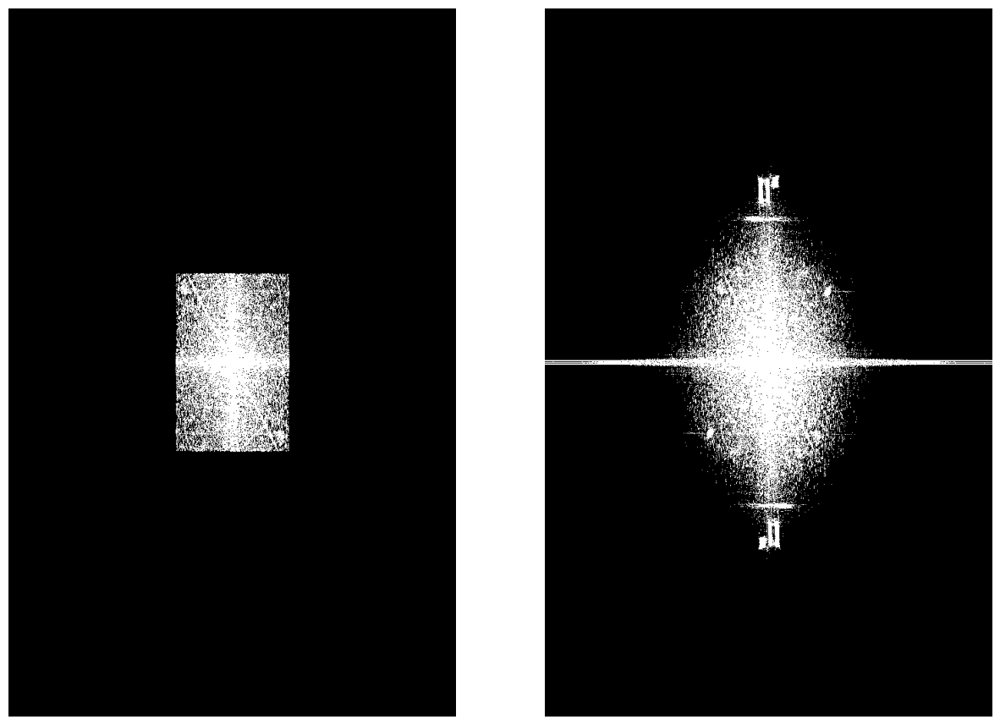

In [139]:
plot_imgs2(res3, res5)

In [140]:
im_blurr_4d = im_blurred[::4, ::4]

In [143]:
im_blurr_4d_fourier, _ = get_spectrum(im_blurr_4d, decimation=4)

In [146]:
_, res6 = cv2.threshold(im_blurr_4d_fourier, 147, 255, cv2.THRESH_BINARY)

Decimated image spectrum after perfect lowpass filter and gaussian filter


<class 'numpy.ndarray'>


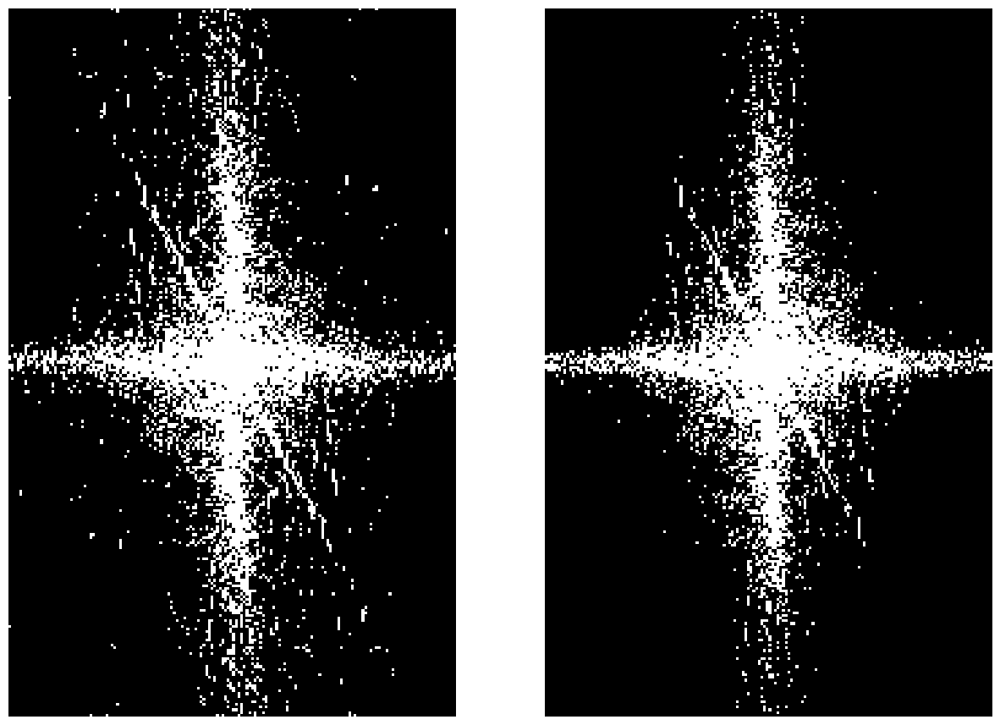

In [147]:
plot_imgs2(res4, res6)

<class 'numpy.ndarray'>


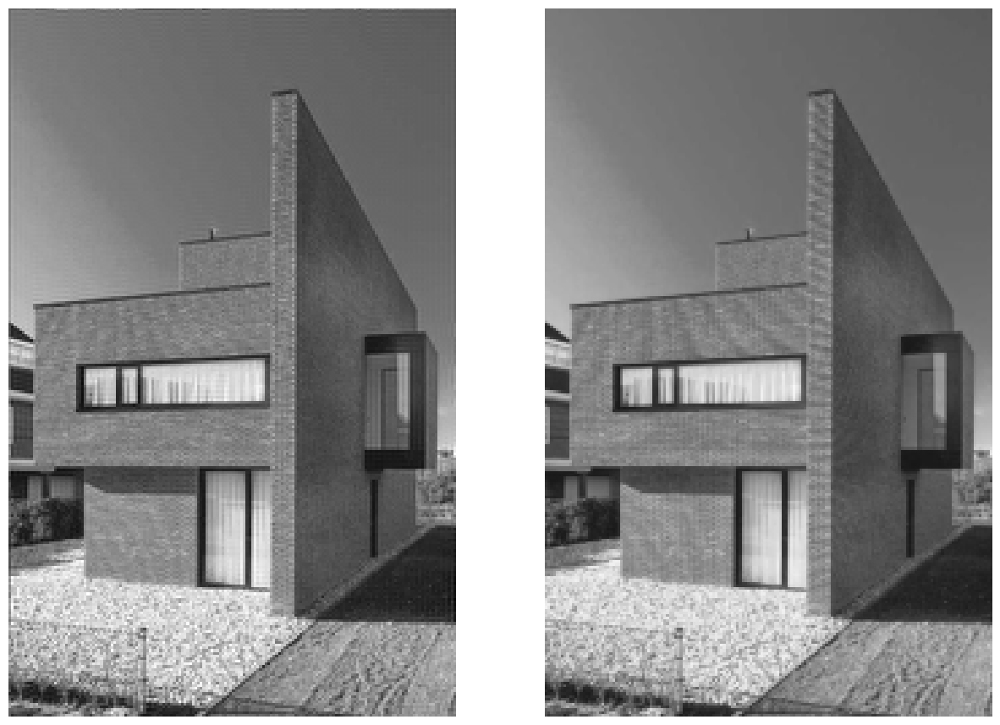

In [ ]:
plot_imgs2(im_filt_4d, im_blurr_4d)

# DFT of different patterns

In [72]:
im1 = cv2.cvtColor(cv2.imread("diag.jpg"), cv2.COLOR_BGR2GRAY)

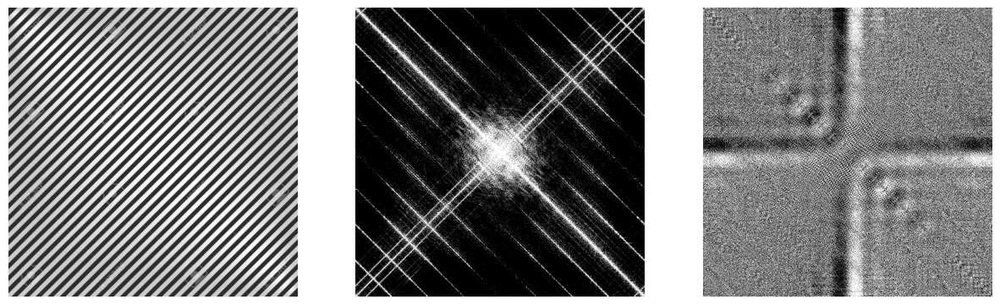

In [73]:
A1, Phi1 = get_spectrum(im1)
_, A11 = cv2.threshold(A1,120, 255,cv2.THRESH_BINARY)
_, Phi11 = cv2.threshold(Phi1, 127, 255,cv2.THRESH_BINARY)
plot_imgs3(im1, A11, Phi11)

In [70]:
im1 = cv2.cvtColor(cv2.imread("mess.jpg"), cv2.COLOR_BGR2GRAY)

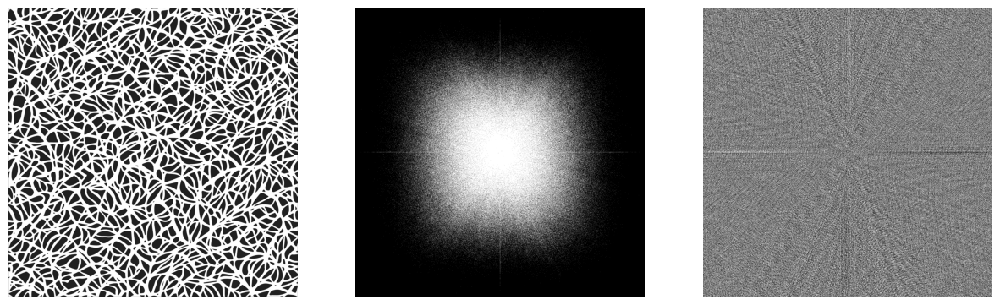

In [71]:
A1, Phi1 = get_spectrum(im1)
_, A11 = cv2.threshold(A1,137, 255,cv2.THRESH_BINARY)
_, Phi11 = cv2.threshold(Phi1, 127, 255,cv2.THRESH_BINARY)
plot_imgs3(im1, A11, Phi11)

In [66]:
im1 = cv2.cvtColor(cv2.imread("small_wave_length.jpg"), cv2.COLOR_BGR2GRAY)

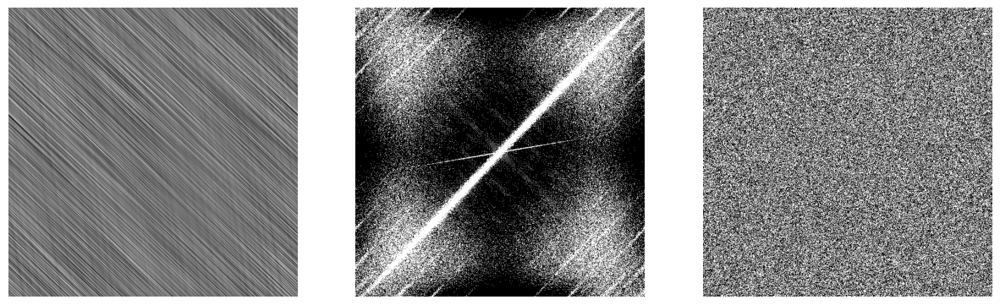

In [69]:
A1, Phi1 = get_spectrum(im1)
_, A11 = cv2.threshold(A1,117, 255,cv2.THRESH_BINARY)
_, Phi11 = cv2.threshold(Phi1, 127, 255,cv2.THRESH_BINARY)
plot_imgs3(im1, A11, Phi11)

In [34]:
im1 = cv2.cvtColor(cv2.imread("grating.jpg"), cv2.COLOR_BGR2GRAY)

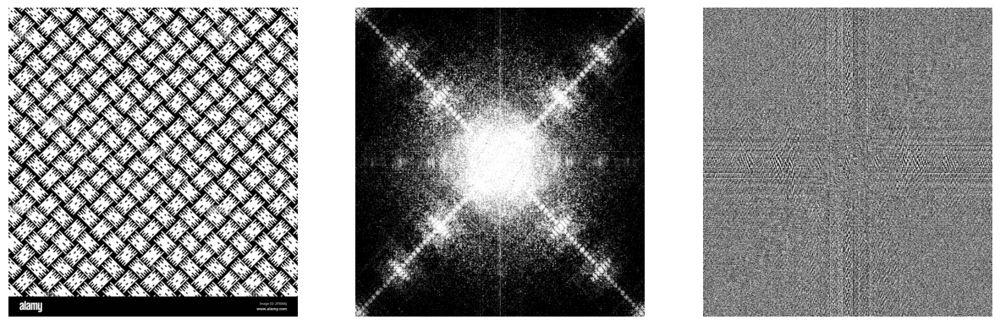

In [37]:
A1, Phi1 = get_spectrum(im1)
_, A11 = cv2.threshold(A1,135, 255,cv2.THRESH_BINARY)
_, Phi11 = cv2.threshold(Phi1, 127, 255,cv2.THRESH_BINARY)
plot_imgs3(im1, A11, Phi11)

In [64]:
im1 = cv2.cvtColor(cv2.imread("grating1.jpg"), cv2.COLOR_BGR2GRAY)

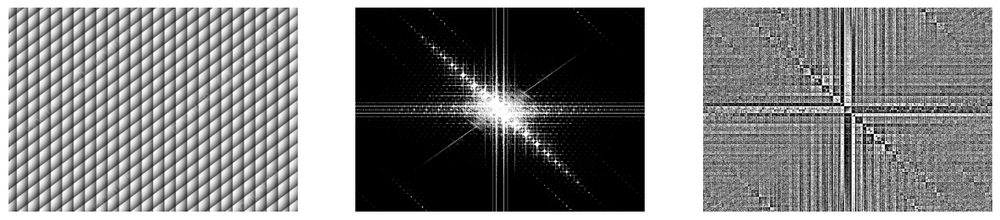

In [65]:
A1, Phi1 = get_spectrum(im1)
_, A11 = cv2.threshold(A1,117, 255,cv2.THRESH_BINARY)
_, Phi11 = cv2.threshold(Phi1, 127, 255,cv2.THRESH_BINARY)
plot_imgs3(im1, A11, Phi11)

In [54]:
im1 = cv2.cvtColor(cv2.imread("pattern1.jpg"), cv2.COLOR_BGR2GRAY)

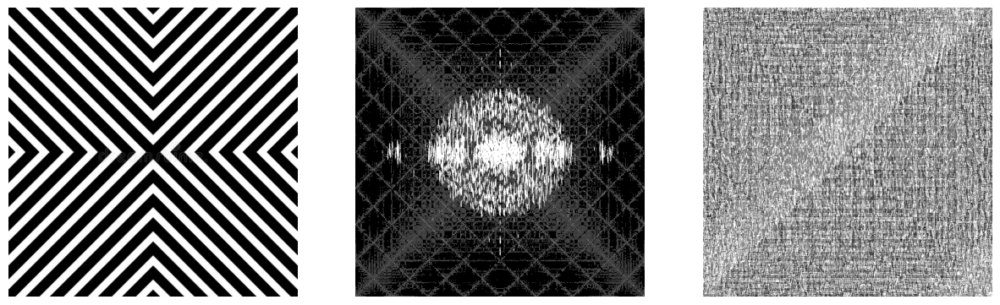

In [63]:
A1, Phi1 = get_spectrum(im1)
_, A11 = cv2.threshold(A1,110, 255,cv2.THRESH_BINARY)
_, Phi11 = cv2.threshold(Phi1, 100, 255,cv2.THRESH_BINARY)
plot_imgs3(im1, A11, Phi11)

In [41]:
im1 = cv2.cvtColor(cv2.imread("pattern2.webp"), cv2.COLOR_BGR2GRAY)

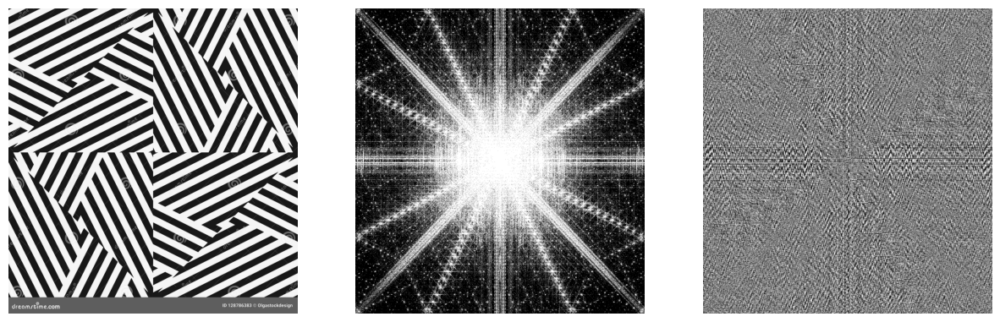

In [49]:
A1, Phi1 = get_spectrum(im1)
_, A11 = cv2.threshold(A1,117, 255,cv2.THRESH_BINARY)
_, Phi11 = cv2.threshold(Phi1, 127, 255,cv2.THRESH_BINARY)
plot_imgs3(im1, A11, Phi11)

In [165]:
im1 = cv2.cvtColor(cv2.imread("Square.png"), cv2.COLOR_BGR2GRAY)

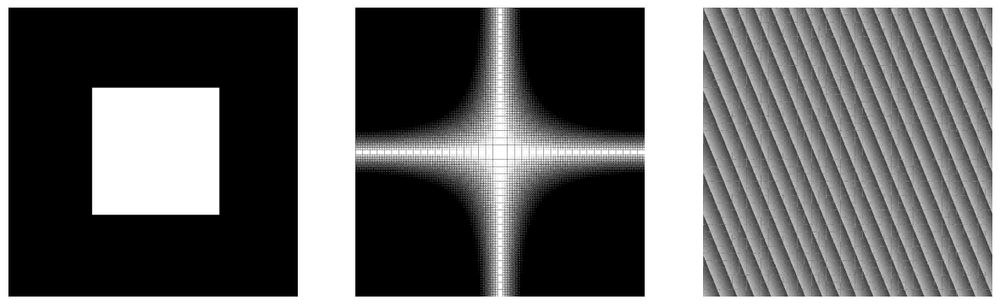

In [166]:
A1, Phi1 = get_spectrum(im1)
_, A11 = cv2.threshold(A1,100, 255,cv2.THRESH_BINARY)
_, Phi11 = cv2.threshold(Phi1, 90, 255,cv2.THRESH_BINARY)
plot_imgs3(im1, A11, Phi1)

In [161]:
im2 = cv2.cvtColor(cv2.imread("Circle.png"), cv2.COLOR_BGR2GRAY)

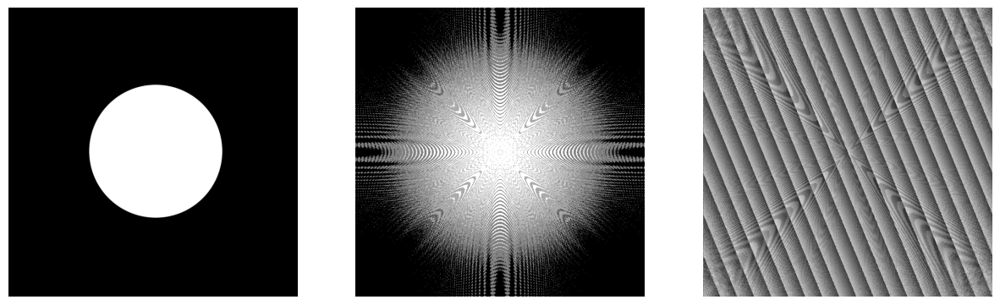

In [162]:
A1, Phi1 = get_spectrum(im2)
_, A11 = cv2.threshold(A1,120, 255,cv2.THRESH_BINARY)
_, Phi11 = cv2.threshold(Phi1, 150, 255,cv2.THRESH_BINARY)
plot_imgs3(im2, A11, Phi1)